In [15]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Load train and test datasets
train_data = pd.read_csv('./train - train.csv')  # Loading the training dataset
test_data = pd.read_csv('./test - test.csv')    # Loading the test dataset


In [16]:
# Check for missing values in train_data and test_data
print(train_data.isnull().sum())  # Print the number of missing values in each column of train_data
print(test_data.isnull().sum())   # Print the number of missing values in each column of test_data


battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               5
four_g           5
int_memory       5
m_dep            5
mobile_wt        4
n_cores          4
pc               5
px_height        4
px_width         2
ram              2
sc_h             1
sc_w             1
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64
id               0
battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
dtype: int64


In [17]:
# Drop rows with missing values from test_data and train_data
test_data = test_data.dropna()    # Drop rows with missing values from test_data
train_data = train_data.dropna()  # Drop rows with missing values from train_data


Dataset Info:
<class 'pandas.core.frame.DataFrame'>
Index: 1991 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  1991 non-null   int64  
 1   blue           1991 non-null   int64  
 2   clock_speed    1991 non-null   float64
 3   dual_sim       1991 non-null   int64  
 4   fc             1991 non-null   float64
 5   four_g         1991 non-null   float64
 6   int_memory     1991 non-null   float64
 7   m_dep          1991 non-null   float64
 8   mobile_wt      1991 non-null   float64
 9   n_cores        1991 non-null   float64
 10  pc             1991 non-null   float64
 11  px_height      1991 non-null   float64
 12  px_width       1991 non-null   float64
 13  ram            1991 non-null   float64
 14  sc_h           1991 non-null   float64
 15  sc_w           1991 non-null   float64
 16  talk_time      1991 non-null   int64  
 17  three_g        1991 non-null   int64  
 18 

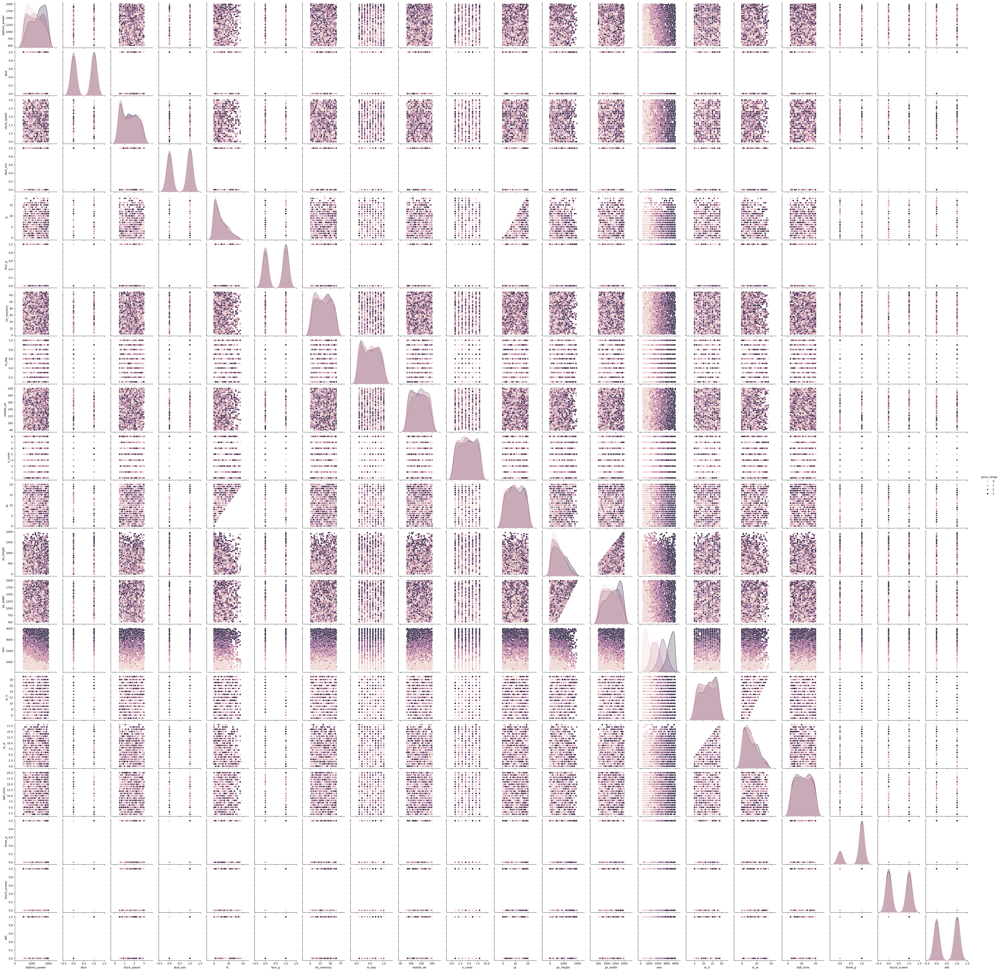

In [18]:
# Display dataset information
print("Dataset Info:")
print(train_data.info())  # Print information about the columns and data types in train_data

# Display first few rows of dataset
print("\nFirst few rows of the dataset:")
print(train_data.head())  # Display the first few rows of train_data

# Perform EDA

## Summary statistics
print("\nSummary Statistics:")
print(train_data.describe())  # Display summary statistics for numerical columns in train_data

## Correlation with target variable (price_range)
print("\nCorrelation with 'price_range':")
print(train_data.corr()['price_range'].sort_values(ascending=False))
# Calculate and print the correlation coefficients of each feature with 'price_range' in train_data

## Pairplot to visualize relationships
sns.pairplot(train_data, hue='price_range')  # Plot pairwise relationships and distributions across the dataset, colored by 'price_range'
plt.show()  # Display the plot

#From the diagram we can notice the importance of the following featurs, whose diagram shows clear differences  (ram,battery_power,px_height,,px_width)


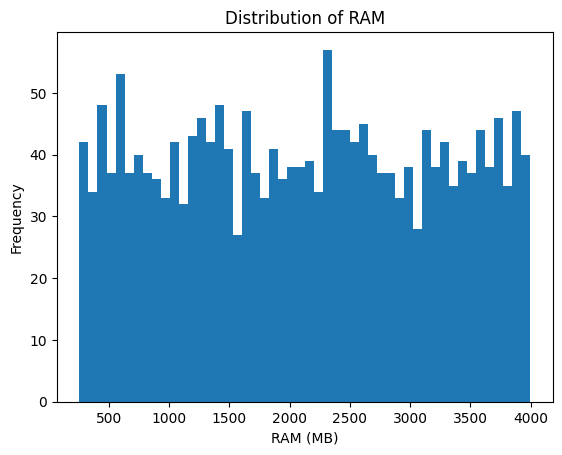

In [19]:
import matplotlib.pyplot as plt

# Plotting histogram of 'ram' column in train_data
plt.hist(train_data['ram'], bins=50)  # Create a histogram with 50 bins for the 'ram' column
plt.xlabel('RAM (MB)')  # Set the x-axis label
plt.ylabel('Frequency')  # Set the y-axis label
plt.title('Distribution of RAM')  # Set the title of the plot
plt.show()  # Display the plot
#from this plot we can see the frequency for each ram value because we know that ram effect on price range


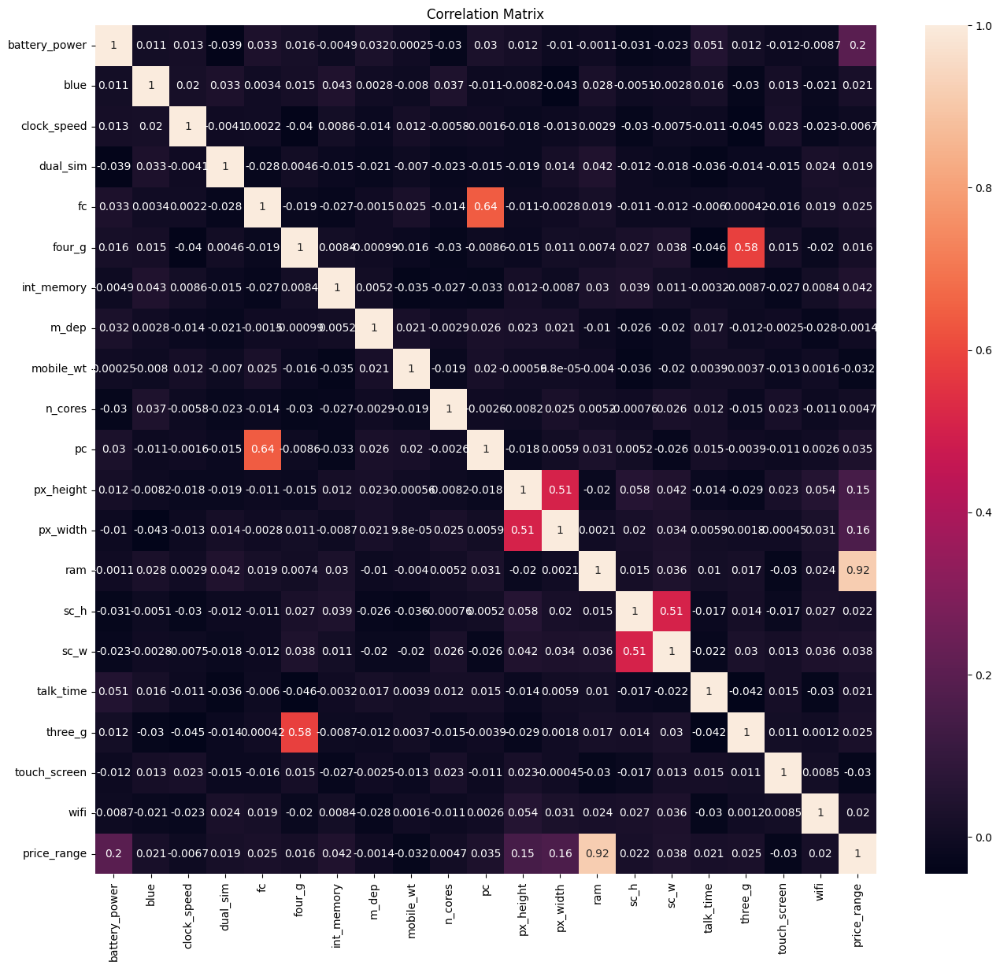

In [20]:
import seaborn as sns

# Calculate correlation matrix
correlation_matrix = train_data.corr()

# Plot heatmap of correlation matrix
plt.figure(figsize=(16, 14))  # Set the figure size
sns.heatmap(correlation_matrix, annot=True)  # Plot heatmap with annotations showing correlation values
plt.title('Correlation Matrix')  # Set the title of the plot
plt.show()  # Display the plot


In [21]:
from sklearn.model_selection import train_test_split

# Separate features (X) and target variable (y)
X = train_data.drop('price_range', axis=1)  # Features: all columns except 'price_range'
y = train_data['price_range']  # Target variable: 'price_range' column

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=42)

# Parameters:
# - X: Features (all columns except 'price_range')
# - y: Target variable ('price_range')
# - test_size: Proportion of the dataset to include in the validation split (here, 30%)
# - random_state: Seed for random number generator for reproducibility

# Now, X_train and y_train contain the training data, and X_val and y_val contain the validation data.


In [22]:
# Import MinMaxScaler from sklearn.preprocessing
from sklearn.preprocessing import MinMaxScaler

# Initialize MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler on training data and transform it
X_train_scaled = scaler.fit_transform(X_train)

# Transform the validation data using the scaler fitted on training data
X_val_scaled = scaler.transform(X_val)

# Transform the test data using the same scaler (assuming 'id' column is dropped)
X_test_scaled = scaler.transform(test_data.drop('id', axis=1))

# Parameters:
# - X_train: Training data features
# - X_val: Validation data features
# - test_data: Test data features
# - 'id': Assuming 'id' column is dropped before scaling

# Explanation:
# - MinMaxScaler scales and translates each feature individually such that it is in the given range on the training set, typically [0, 1].
# - Scaling ensures that all features are on the same scale, preventing any particular feature from dominating due to its larger range of values.
# - `fit_transform()` computes the minimum and maximum to be used for later scaling and scales the data.
# - `transform()` scales the validation and test data using the minimum and maximum computed by `fit_transform()` on the training data.
# - This ensures consistency in scaling across all datasets (training, validation, and test) and supports optimal performance of machine learning models.


In [27]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, accuracy_score
import matplotlib.pyplot as plt

def con_matrix(actual, predicted):
    # Compute the confusion matrix
    matrix = confusion_matrix(actual, predicted, labels=[0, 1, 2, 3])
    print('Confusion matrix:\n', matrix)

    # Display the confusion matrix
    cmd_obj = ConfusionMatrixDisplay(matrix, display_labels=['low cost', 'medium cost', 'high cost', 'very high cost'])
    cmd_obj.plot(cmap='Blues', values_format='d')  # 'd' for integer formatting
    cmd_obj.ax_.set(xlabel='Predicted', ylabel='Actual')
    plt.title('Confusion Matrix')
    plt.grid(False)
    plt.show()

    # Display the classification report
    report = classification_report(actual, predicted, labels=[0, 1, 2, 3], target_names=['low cost', 'medium cost', 'high cost', 'very high cost'])
    print('Classification report:\n', report)

    # Display the accuracy score
    accuracy = accuracy_score(actual, predicted) * 100
    print('Accuracy score:\n', accuracy)

# Example usage:
# Assuming 'actual' and 'predicted' are arrays containing actual and predicted labels respectively
# con_matrix(actual, predicted)


Confusion matrix:
 [[149   8   0   0]
 [ 11 121  10   0]
 [  0  15 129  14]
 [  0   0   6 135]]


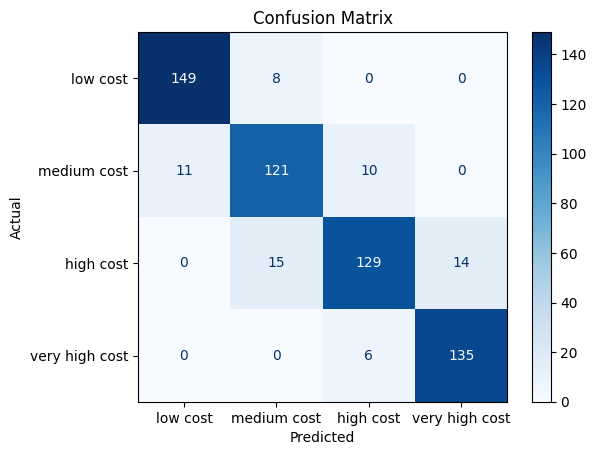

Classification report:
                 precision    recall  f1-score   support

      low cost       0.93      0.95      0.94       157
   medium cost       0.84      0.85      0.85       142
     high cost       0.89      0.82      0.85       158
very high cost       0.91      0.96      0.93       141

      accuracy                           0.89       598
     macro avg       0.89      0.89      0.89       598
  weighted avg       0.89      0.89      0.89       598

Accuracy score:
 89.29765886287625


In [28]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

model = RandomForestClassifier(max_depth=20,min_samples_split= 2,n_estimators=400, random_state=42)
model.fit(X_train_scaled, y_train)

y_pred = model.predict(X_val_scaled)

con_matrix(y_val, y_pred)



In [ ]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300, 400],
    'max_depth': [None, 10, 20, 30, 40],
    'min_samples_split': [2, 5, 10, 15]
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy')

# Fit GridSearchCV using scaled training data
grid_search.fit(X_train_scaled, y_train)

# Print the best parameters found by GridSearchCV
print("Best Parameters:", grid_search.best_params_)


Best Parameters: {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 400}


In [30]:
#test using test dataset
test_predictions = model.predict(X_test_scaled)



In [31]:
test_predictions


array([3, 3, 2, 3, 1, 3, 3, 1, 3, 0, 3, 3, 0, 0, 2, 0, 1, 1, 3, 2, 1, 3,
       1, 1, 3, 0, 2, 0, 2, 0, 2, 0, 3, 0, 0, 1, 3, 1, 2, 1, 1, 2, 0, 0,
       0, 1, 0, 3, 1, 2, 2, 0, 2, 0, 3, 1, 3, 1, 1, 3, 3, 2, 0, 1, 1, 1,
       1, 3, 1, 1, 1, 2, 2, 3, 3, 0, 2, 0, 2, 3, 0, 3, 3, 0, 3, 0, 3, 1,
       3, 0, 1, 2, 2, 1, 2, 1, 0, 2, 1, 3, 1, 0, 0, 3, 1, 2, 0, 1, 2, 3,
       3, 3, 1, 3, 3, 3, 3, 1, 3, 0, 0, 3, 2, 1, 1, 0, 3, 2, 3, 1, 0, 2,
       1, 1, 3, 1, 1, 0, 3, 2, 1, 2, 2, 3, 2, 3, 3, 2, 2, 3, 2, 3, 0, 0,
       3, 2, 3, 3, 3, 3, 2, 2, 3, 3, 3, 3, 1, 0, 3, 0, 0, 0, 1, 1, 0, 1,
       0, 0, 1, 2, 0, 0, 0, 1, 2, 2, 2, 1, 0, 0, 0, 1, 0, 3, 1, 0, 2, 2,
       2, 3, 1, 2, 3, 3, 3, 2, 2, 1, 0, 0, 1, 2, 1, 2, 3, 3, 0, 2, 0, 3,
       2, 3, 3, 0, 0, 1, 0, 3, 0, 1, 0, 2, 2, 1, 3, 0, 3, 0, 3, 1, 2, 0,
       0, 2, 1, 3, 2, 3, 1, 1, 3, 0, 0, 2, 3, 3, 1, 3, 1, 1, 3, 2, 1, 2,
       3, 3, 3, 1, 0, 1, 2, 3, 1, 1, 3, 2, 0, 3, 0, 1, 2, 0, 0, 3, 2, 3,
       2, 2, 1, 3, 3, 2, 3, 2, 2, 1, 2, 0, 2, 3, 1,

# **XGBClassifier**

Confusion matrix:
 [[149   8   0   0]
 [  4 131   7   0]
 [  0   8 137  13]
 [  0   0   4 137]]


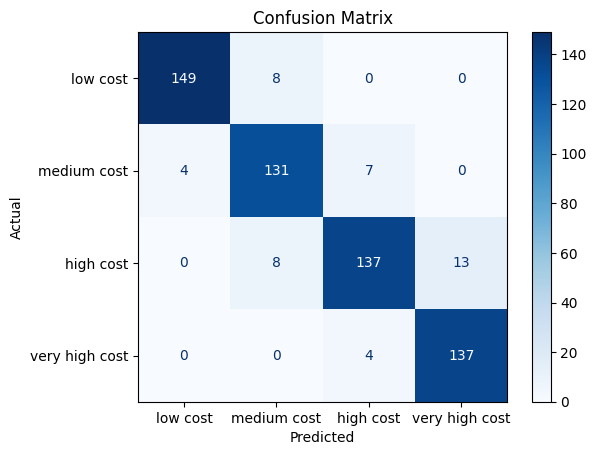

Classification report:
                 precision    recall  f1-score   support

      low cost       0.97      0.95      0.96       157
   medium cost       0.89      0.92      0.91       142
     high cost       0.93      0.87      0.90       158
very high cost       0.91      0.97      0.94       141

      accuracy                           0.93       598
     macro avg       0.93      0.93      0.93       598
  weighted avg       0.93      0.93      0.93       598

Accuracy score:
 92.64214046822742


In [37]:
#here i training XGBClassifier which is one of the best models that used for numeric data like our data.
from numpy import asarray
from sklearn.datasets import make_classification
from xgboost import XGBClassifier

model = XGBClassifier(use_label_encoder=False,eval_metric='mlogloss',n_estimators=100)
model.fit(X_train_scaled,y_train)

y_hat = model.predict(X_val_scaled)

con_matrix(y_val,y_hat)



In [39]:
#test using test dataset
test_predictions = model.predict(X_test_scaled)



In [40]:
test_predictions


array([3, 3, 3, 3, 1, 3, 3, 1, 3, 0, 3, 3, 0, 0, 2, 0, 2, 1, 3, 2, 1, 3,
       1, 1, 3, 0, 2, 0, 2, 0, 3, 0, 3, 0, 1, 1, 3, 1, 2, 1, 1, 2, 0, 0,
       0, 1, 0, 3, 1, 2, 1, 0, 3, 0, 3, 1, 3, 1, 0, 3, 3, 2, 0, 2, 1, 1,
       2, 3, 1, 2, 1, 2, 2, 3, 3, 0, 2, 0, 2, 3, 1, 3, 3, 0, 3, 0, 3, 1,
       3, 0, 1, 2, 2, 0, 2, 1, 0, 2, 1, 2, 1, 0, 0, 3, 0, 2, 0, 1, 2, 3,
       3, 3, 1, 3, 3, 3, 3, 2, 3, 0, 0, 3, 2, 1, 1, 0, 3, 2, 3, 1, 0, 2,
       1, 1, 3, 1, 2, 0, 3, 2, 1, 2, 1, 2, 2, 3, 3, 3, 2, 3, 2, 3, 0, 0,
       3, 2, 3, 3, 3, 3, 2, 2, 3, 3, 3, 3, 1, 0, 3, 0, 0, 0, 2, 1, 0, 1,
       0, 0, 1, 2, 0, 0, 0, 1, 1, 2, 2, 1, 0, 0, 0, 1, 0, 3, 2, 0, 2, 2,
       2, 3, 1, 2, 3, 3, 3, 2, 1, 1, 0, 0, 1, 2, 0, 3, 3, 3, 0, 2, 0, 3,
       2, 3, 3, 1, 0, 1, 0, 3, 0, 1, 0, 2, 2, 1, 3, 1, 3, 0, 3, 1, 2, 0,
       0, 2, 1, 3, 3, 3, 1, 1, 3, 0, 0, 2, 3, 3, 1, 3, 1, 1, 3, 2, 1, 2,
       3, 3, 3, 1, 0, 1, 2, 3, 1, 1, 3, 2, 0, 3, 0, 0, 2, 0, 0, 3, 2, 3,
       3, 2, 1, 3, 3, 2, 3, 1, 2, 1, 2, 0, 2, 3, 1,

In [38]:
import joblib

# Save the model to a file
joblib.dump(model, 'model.pkl')

print("Model saved successfully as 'model.pkl'")

Model saved successfully as 'model.pkl'


In [ ]:
#RandomForestClassifier: It belongs to the ensemble learning method known as bagging.
# It builds multiple decision trees and merges them together to get a more accurate and stable prediction.

#XGBClassifier (XGBoost): It belongs to the boosting ensemble learning method.
#Boosting builds trees sequentially, where each subsequent tree aims to correct the errors of the previous one.
#XGBoost uses gradient boosting algorithms which optimize the overall model performance.

#So it was expected to be better